<img src="esp_disk_2d_halo.gif" align="right" width="600px"/> 

# Exponential disk distribution

The surface-brightness profile is

$$ I = I_0 e^{-\frac{r}{r_s}} $$

and so the surface density

$$\Sigma (r) = \Sigma_0 e^{-\frac{r}{r_s}} $$

where (M o $M(r_s)$?)

$$ \Sigma_0 = I_0 \frac{M}{L} = \frac{M}{2 \pi r_s^2} $$

The cumulative mass distribution M(r) can be found by integrating from 0 to r
$$ M(r) = \int_0^r \Sigma(r)dS = \int_0^r  \Sigma_0 e^{-\frac{r}{r_s}} 2 \pi rdr = \text{IBP}$$

$$ M(r) = 2 \pi \Sigma_0 r_s^2 \bigg[ 1 - e^{-\frac{r}{r_s}} \bigg(1 + \frac{r}{r_s} \bigg) \bigg] $$

where

$$ 2 \pi \Sigma_0 r_s^2 = M_{tot}$$

The cumulative is P such as

$$ 0 < P = \frac{M(r)}{M} < 1 $$

since 
$$
\begin{cases}
M(r=0) = 0  \\
M(r = r_s) = (1 - 2/e) M \simeq  0.26 M \\
M(r = \inf ) \rightarrow M \\
\end{cases}
$$


## Scale radius

The scale radius $r_s$ is defined as the radius at which the brightness profile decreases by a factor $1/e$:

$$ \frac{ I(r_s)}{I_0} = e^{-\frac{r_s}{r_s}} = \frac{1}{e} $$

### Useful functions

In [1]:
#Brightness profile
def prof(r):
    return I_0*np.exp(-r/R_d)

#Surface density
def dens(r):
    return sigma_0*np.exp(-r/R_d)

#cumulative
def r_cum(r):
    return 1 - np.exp(-r/R_d)*(1 + r/R_d)

In [2]:
#Potentials
def Hern_pot(r, H_mass, H_a):
    return -H_mass*G/(r + H_a)

def disk_pot(r):
    
    '''This function evaluates the potential of an exponential disk, using the 
    modified Bessel's functions K and I.'''
    
    y = r / (2 * R_d)
    
    I_0_y = scipy.special.iv(0, y)
    K_0_y = scipy.special.kv(0, y)
    I_1_y = scipy.special.iv(1, y)
    K_1_y = scipy.special.kv(1, y)
    
    return - np.pi * G * sigma_0 * r * (I_0_y * K_1_y - I_1_y * K_0_y)

def tot_pot(r):
    return disk_pot(r) + Hern_pot(r, M_halo, a_halo) + 0*Hern_pot(r, M_bulge, a_bulge)

In [3]:
#disk circular vel
def v_circ_disk(r):
    
    '''This function evaluates the disk circular velocity, using the modified Bessel's functions K and I.'''
    
    y = r / (2 * R_d)
    
    I_0_y = scipy.special.iv(0, y)
    K_0_y = scipy.special.kv(0, y)
    I_1_y = scipy.special.iv(1, y)
    K_1_y = scipy.special.kv(1, y)
    
    v_circ_disk2 = 4 * np.pi * G * sigma_0 * R_d * y**2 * (I_0_y * K_0_y - I_1_y * K_1_y)
    
    return np.sqrt( v_circ_disk2 )

#Hernquist halo and bulge circular vel
def v_Hern(r, H_mass, H_a):
    
    return np.sqrt(G * H_mass * r)/(r + H_a)

#total circular vel: squared sum
def v_circ(r):
    
    return np.sqrt( (v_circ_disk(r))**2 + (v_Hern(r, M_halo, a_halo))**2 + 0*(v_Hern(r, M_bulge, a_bulge))**2 )

In [4]:
#escape velocity
def v_escape(r):
    return np.sqrt( -2*( disk_pot(r) + Hern_pot(r, M_halo, a_halo) + 0*Hern_pot(r, M_bulge, a_bulge)) )

In [5]:
#orbital freq
def omega_Hern(r,H_mass,H_a):
    
    return np.sqrt( G * H_mass / r  ) / (r + H_a)

def omega_circ_disk(r):
    
    '''This function evaluates the disk circular angular velocity, using the modified Bessel's functions K and I.'''
    
    return v_circ_disk(r) / r

def omega_tot(r):
    
    return np.sqrt( (omega_circ_disk(r))**2 + (omega_Hern(r,M_halo,a_halo))**2 + 0*(omega_Hern(r,M_bulge,a_bulge))**2 )

In [6]:
#epicyclic freq
def kappa_Hern(r,H_mass,H_a):
    return np.sqrt( G * H_mass * (r + 3 * H_a) / ( r * (r + H_a)**3  ))

def kappa_disk(r):
    
    '''This function evaluates the epicyclic frequency, using the modified Bessel's functions K and I.'''
    
    y = r / (2 * R_d)
    
    I_0_y = scipy.special.iv(0, y)
    K_0_y = scipy.special.kv(0, y)
    I_1_y = scipy.special.iv(1, y)
    K_1_y = scipy.special.kv(1, y)
    
    dI_0_y = scipy.special.ivp(0, y)
    dK_0_y = scipy.special.kvp(0, y)
    dI_1_y = scipy.special.ivp(1, y)
    dK_1_y = scipy.special.kvp(1, y)
    
    omega_2 = (omega_circ_disk(r))**2
    deriv = (dI_0_y * K_0_y + dK_0_y * I_0_y - I_1_y * dK_1_y - dI_1_y * K_1_y) * 0.5 * 1/R_d
    const = np.pi * G * sigma_0 / R_d
    
    return np.sqrt(4 * omega_2 + r * const * deriv)

def k_tot(r):
    return np.sqrt( (kappa_disk(r))**2 + (kappa_Hern(r,M_halo,a_halo))**2 + 0*(kappa_Hern(r,M_bulge,a_bulge))**2 )

In [7]:
#velocity dispersions

def sigma_r(r,Q):
    
    return  3.36 * G * Q * dens(r)  / k_tot(r)

def sigma_phi(r,Q):
    
    '''This function evaluates the dispersion along r, using the modified Bessel's functions K and I.'''
    
    return sigma_r(r,Q) * k_tot(r) / (2 * omega_tot(r))

In [8]:
import numpy as np
import scipy
import math
import random
import pandas as pd
import scipy.interpolate as interp
from matplotlib import animation
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
import os
import time
#from scipy.constants import G

from matplotlib import pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

## Define param

In [9]:
#disk
I_0 = 1
M = 1
N = 20000
m = M/N 
R_d = 1
sigma_0 = M / (2*np.pi*R_d**2)
G=1

#Hernquist halo
M_halo = 6.0
a_halo = 10.0

#Hernquist bulge (not used)
M_bulge = 0.5
a_bulge = 0.2

In [10]:
r_grid = np.linspace(0, 10*R_d, 200)
I_teo = prof(r_grid)
Sigma_r = dens(r_grid)

I_rs = I_teo[np.where(r_grid<R_d)][-1]

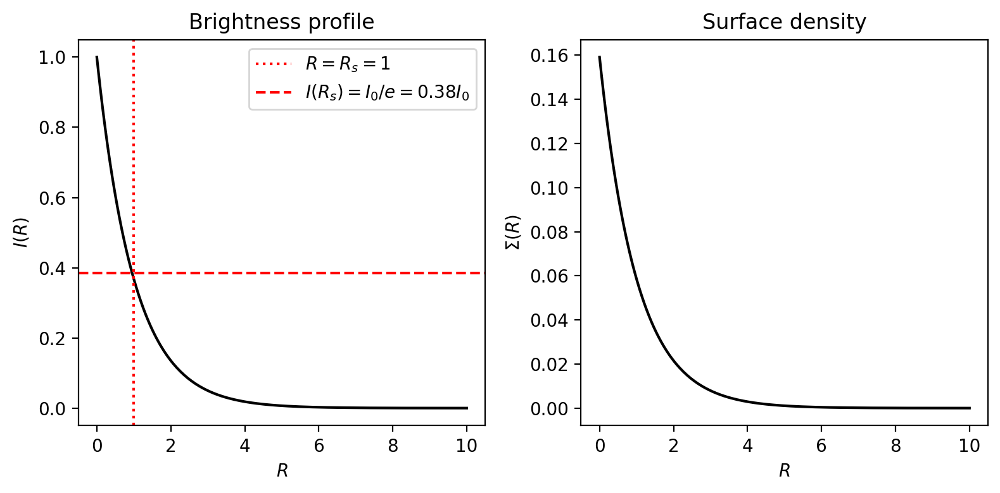

In [11]:
fig = plt.figure(tight_layout=True, figsize=(8, 4)) 

ax = fig.add_subplot(121)
ax.plot(r_grid, I_teo, c='black')
ax.axvline(R_d, color='r', linestyle='dotted', label = '$R = R_s =$'f'{R_d}')
ax.axhline(I_rs, color='r', linestyle='dashed', label = f'$I(R_s) = I_0/e ={round(I_rs,2)}$''$I_0$')
ax.set_title(r'Brightness profile', fontsize=12)
ax.set_xlabel(r'$R$')
ax.set_ylabel(r'$I(R)$')
ax.legend()

ax = fig.add_subplot(122)
ax.plot(r_grid, Sigma_r, c='black')
ax.set_title(r'Surface density', fontsize=12)
ax.set_xlabel(r'$R$')
ax.set_ylabel(r'$\Sigma(R)$')

plt.show()

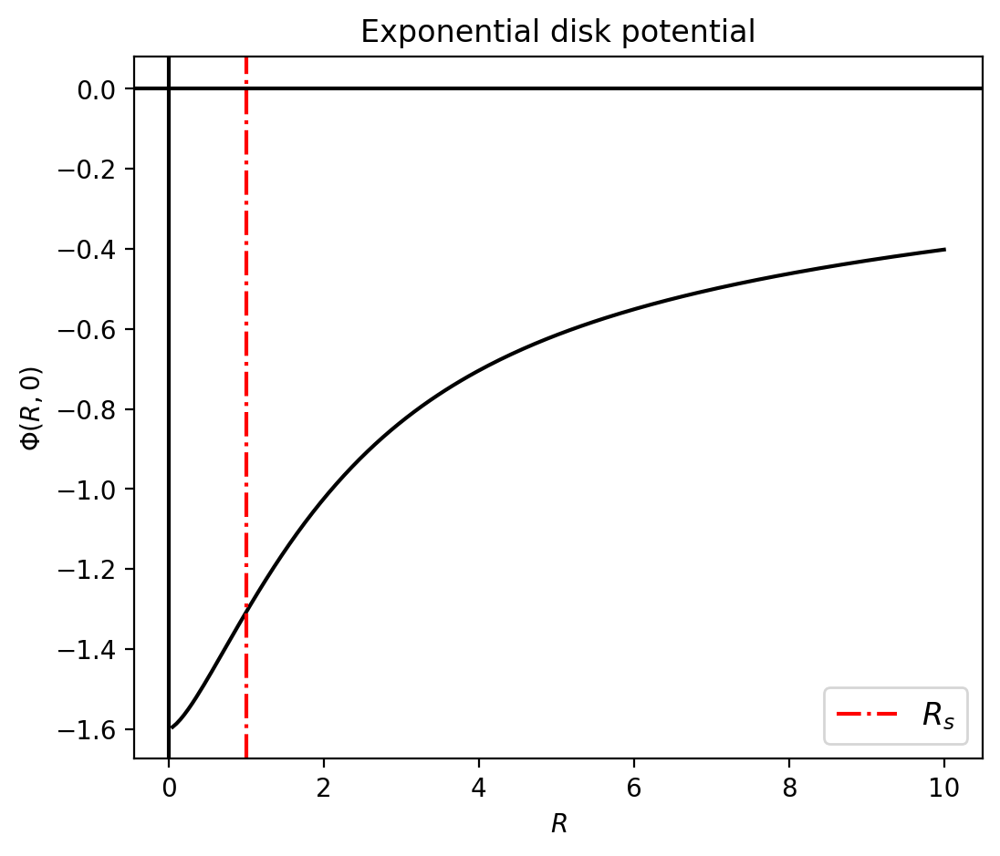

In [12]:
plt.figure(figsize=(6, 5))
plt.plot(r_grid[1:], tot_pot(r_grid[1:]), color='black') 
plt.axvline(x=R_d, label='$R_s$', c='red', linestyle='-.')
plt.axvline(0,c='black')
plt.axhline(0,c='black')
#plt.ylim(-5,1)
plt.xlabel('$R$')
plt.ylabel('$\Phi(R,0)$')
plt.legend(fontsize='large')
plt.title(r'Exponential disk potential');

In [13]:
x_grid = np.linspace(-6 * R_d, 6 * R_d, 100)
y_grid = np.linspace(-6 * R_d, 6 * R_d, 100)

X, Y = np.meshgrid(x_grid, y_grid)
Z = tot_pot(np.sqrt(X**2+Y**2))

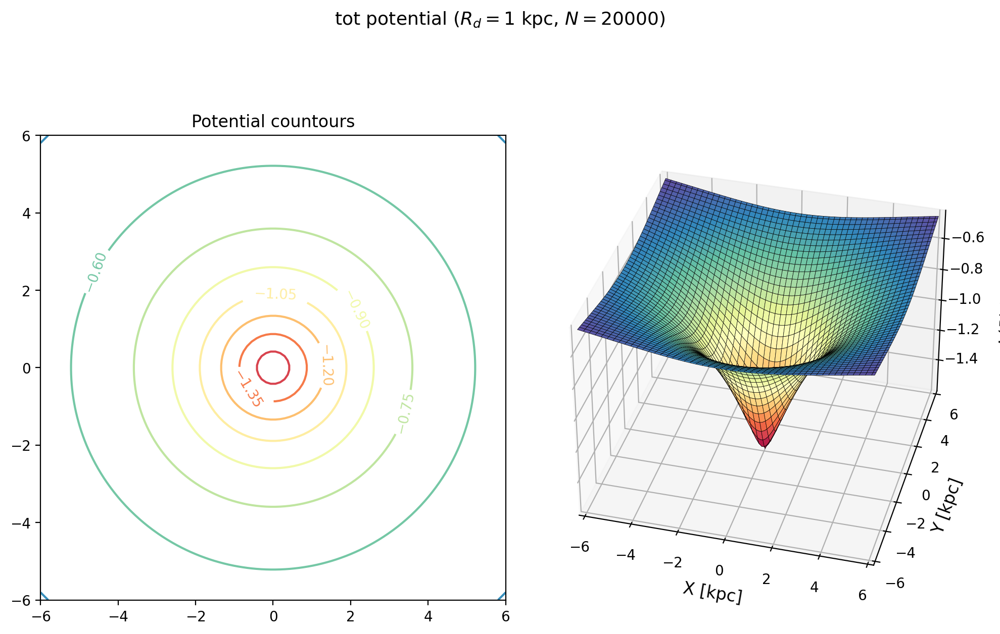

In [14]:
#%matplotlib notebook

fig = plt.figure(figsize=(10, 7), tight_layout=True)
fig.suptitle('tot potential ($R_d='f'{R_d}''$ kpc, $N ='f'{N}''$)', fontsize=13)

ax = fig.add_subplot(121)


CS = ax.contour(X, Y, Z, cmap='Spectral')
ax.clabel(CS, inline=True, fontsize=10)
ax.set_title('Potential countours')
ax.set_xlim(-6 * R_d, 6 * R_d)
ax.set_ylim(-6 * R_d, 6 * R_d)
ax.set_aspect('equal')

ax = fig.add_subplot(122, projection='3d')

#ax.xaxis.pane.fill = False
#ax.yaxis.pane.fill = False
#ax.zaxis.pane.fill = False
 
ax.plot_surface(X, Y, Z, cmap='Spectral', edgecolor='black', lw=0.25)
ax.set_xlabel('X [kpc]', fontsize=12)
ax.set_ylabel('Y [kpc]', fontsize=12)
ax.set_zlabel('\n\n $\Phi(R)$ [$M_{\odot}$ / kpc]', fontsize=12)
ax.set_xlim(-6 * R_d, 6 * R_d)
ax.set_ylim(-6 * R_d, 6 * R_d)
ax.set_zlim(np.min(Z), np.max(Z))
ax.view_init(35, -75)
plt.tight_layout();
#plt.savefig('expdisk-dist.pdf');

# Set initial parameters

## Cumulative & scale radius

The scale radius $r_s$ is defined as the radius at which the brightness profile decreases by a factor $1/e$, but let's see how much of the total mass is encompassed in the scale radius (recall my cosmology exam....):

In [15]:
M_r = r_cum(r_grid)
P_r = M_r/M

P_rs = P_r[np.where(r_grid<R_d)][-1]

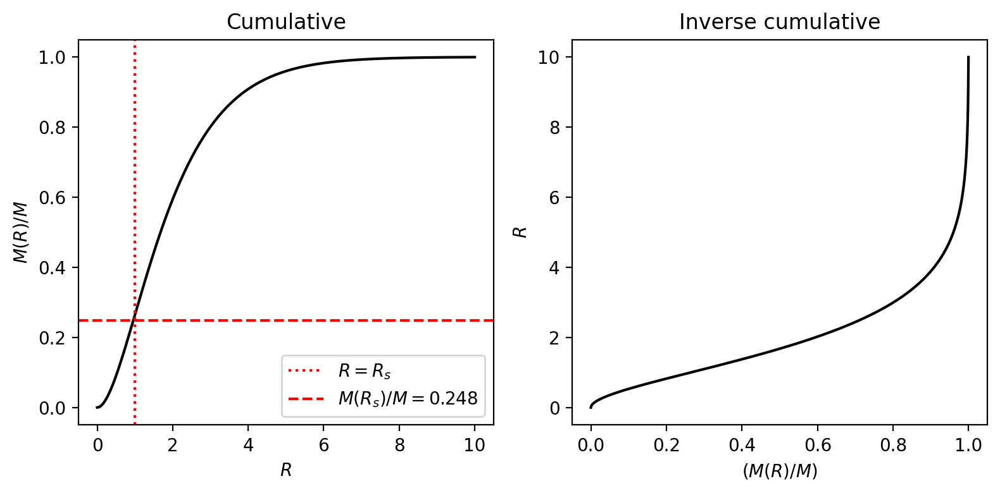

In [16]:
fig = plt.figure(tight_layout=True, figsize=(8, 4)) 

ax = fig.add_subplot(121)
ax.plot(r_grid, P_r, c='black')
ax.axvline(R_d, color='r', linestyle='dotted', label = '$R = R_s$')
ax.axhline(P_rs, color='r', linestyle='dashed', label = f'$M(R_s)/M ={round(P_rs,3)}$')
ax.set_title(r'Cumulative', fontsize=12)
ax.set_xlabel(r'$R$')
ax.set_ylabel(r'$M(R)/M$')
ax.legend()

ax = fig.add_subplot(122)
ax.plot(P_r, r_grid, c='black')
ax.set_title(r'Inverse cumulative', fontsize=12)
ax.set_ylabel(r'$R$')
ax.set_xlabel(r'$(M(R)/M)$')

plt.show()

## Compute initial configuration: positions

In [17]:
x_i = np.linspace(0.0001, 1, N)
R = np.interp(x_i, P_r, r_grid)
len(R)
phi = np.random.uniform(0, 2*np.pi, N)

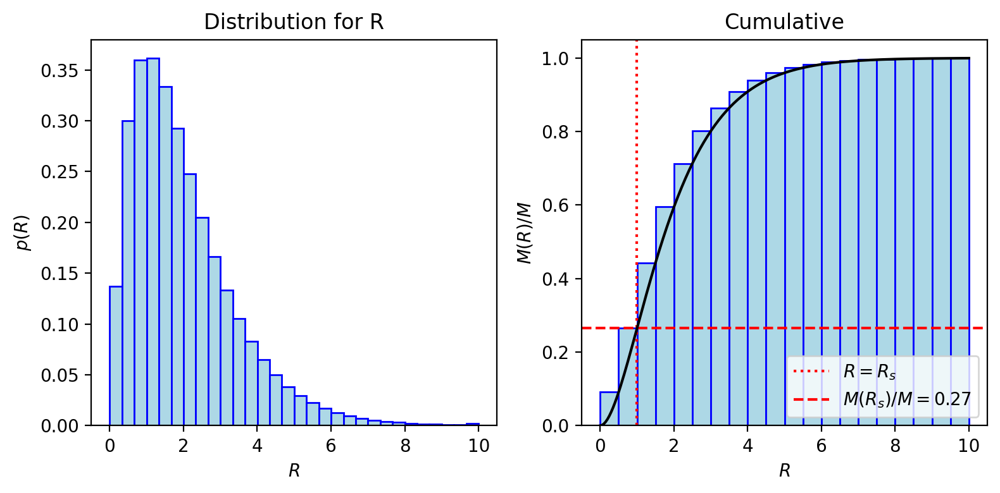

In [18]:
fig = plt.figure(tight_layout=True, figsize=(8, 4)) 

ax = fig.add_subplot(121)
ax.hist(R, bins=30, histtype='bar', ec='b', fc='lightblue', density=True)
ax.set_title(r'Distribution for R', fontsize=12)
ax.set_xlabel(r'$R$')
ax.set_ylabel(r'$p(R)$')

ax = fig.add_subplot(122)
counts, bin_, _ = ax.hist(R, bins=20, histtype='bar', ec='b', fc='lightblue', cumulative=True, density=True)

rs_hist=counts[np.where(bin_<R_d)][-1]

ax.axvline(R_d, color='r', linestyle='dotted', label = '$R = R_s$')
ax.axhline(rs_hist, color='r', linestyle='dashed', label = f'$M(R_s)/M ={round(rs_hist,2)}$')
ax.plot(r_grid, P_r, c='black')
ax.set_title(r'Cumulative', fontsize=12)
ax.set_xlabel(r'$R$')
ax.set_ylabel(r'$M(R)/M$')
ax.legend()

plt.show()

In [19]:
# Initial positions for N points in 3D cartesian coordinates

x = R * np.cos(phi)
y = R * np.sin(phi)
z = np.zeros(N)

# Compute CM

x_cm = np.sum(x*m)/M
y_cm = np.sum(y*m)/M
z_cm = np.sum(z*m)/M
print(x_cm, y_cm, z_cm)

0.006822391946303973 -0.0030674132683826665 0.0


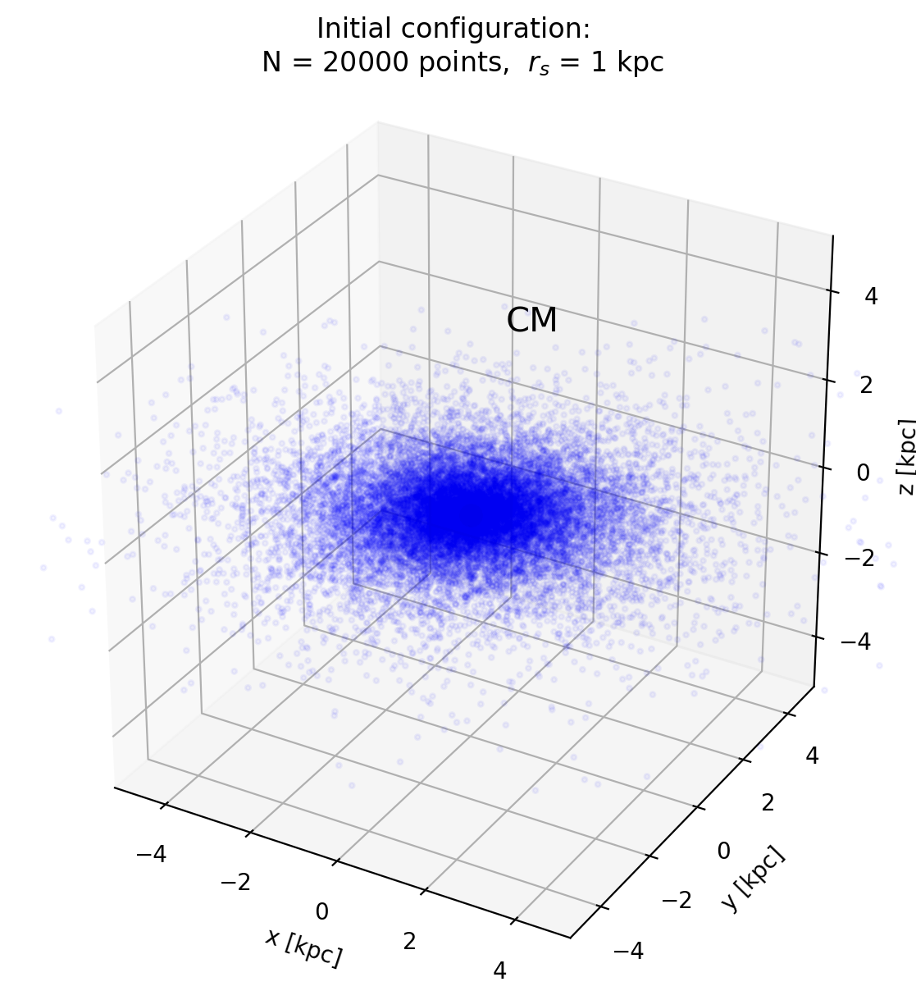

In [20]:
#%matplotlib notebook

fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('x [kpc]')
ax.set_ylabel('y [kpc]')
ax.set_zlabel('z [kpc]')
ax.set_xlim(-5*R_d,5*R_d)
ax.set_ylim(-5*R_d,5*R_d)
ax.set_zlim(-5*R_d,5*R_d)
ax.set_title(f'Initial configuration: \n N = {N} points,  $r_s$ = {R_d} kpc')

ax.scatter(x, y, z, s=5, c='blue', alpha=0.05)
ax.scatter(x_cm, y_cm, z_cm, s=80, c='black', marker='o',zorder=1) #Center of mass
ax.text(x_cm+0.5, y_cm+0.5, z_cm+4, 'CM', fontsize=15, c='black')

ax.set_box_aspect([1,1,1])
plt.show()

## Conditions for bar formation: pattern speed $\Omega_p$ 
### Halo only and halo + bulge

We want to see a flat zone indicating the bar in the frequency vr R graph

In [21]:
M_disk = 1
R_disk = 1

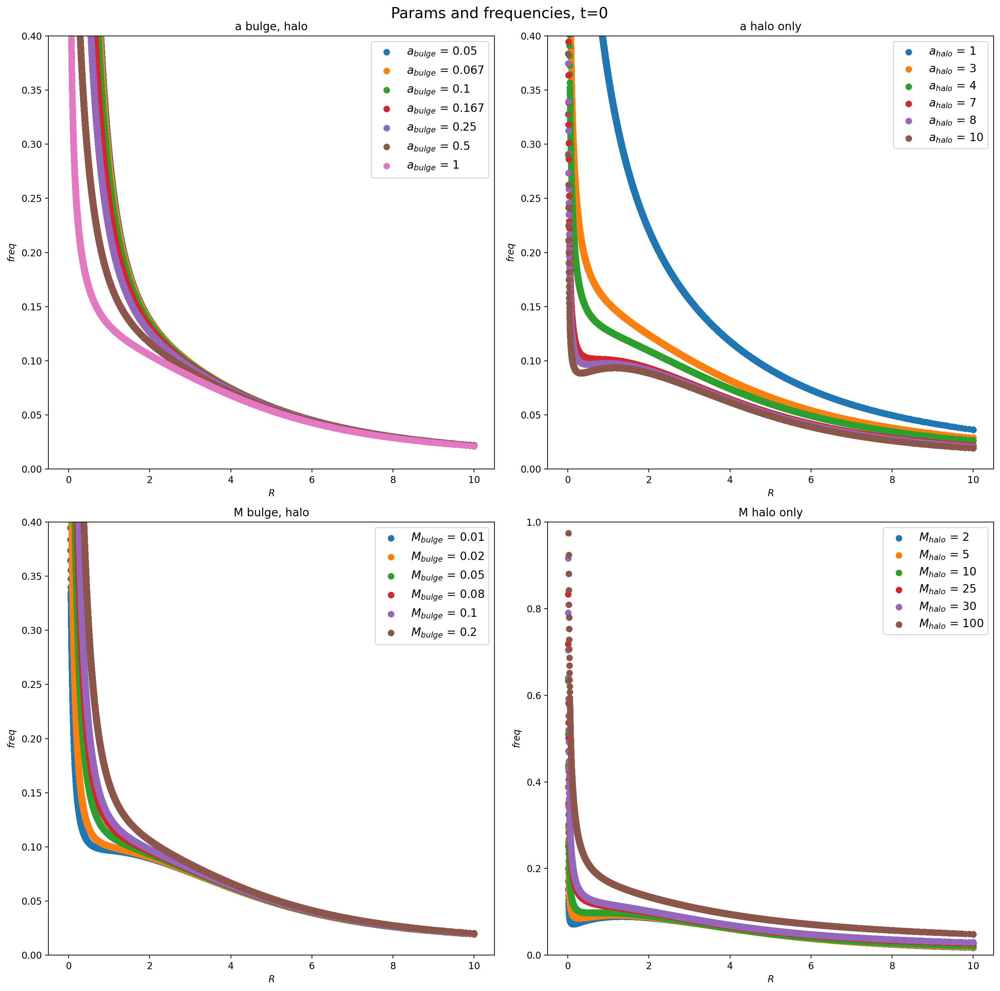

In [22]:
a_b_i = [1/20,1/15,1/10,1/6,1/4,0.5,1]
a_halo_i = [1,3,4,7,8,10]
M_halo_i = [2,5,10,25,30,100]
M_bulge_i = [0.01,0.02,0.05,0.08,0.1,0.2]

fig = plt.figure(figsize = (15,15))
fig.suptitle('Params and frequencies, t=0', fontsize=16)

ax = fig.add_subplot(221)

for i in a_b_i:

    ax.scatter(R, np.sqrt( (omega_Hern(R, M_halo, a_halo))**2 + (omega_Hern(R, M_bulge, i*R_d))**2 + (omega_circ_disk(R))**2 )
 - np.sqrt( (kappa_Hern(R, M_halo, a_halo))**2 + (kappa_Hern(R, M_bulge, i*R_d))**2 + (kappa_disk(R))**2 )/2, label='$a_{bulge}$ = 'f'{round(i,3)}')

ax.set_ylim(0,0.4)
ax.set_xlabel('$R$')
ax.set_ylabel('$freq$')
ax.legend(fontsize='large')
ax.set_title('a bulge, halo')

ax = fig.add_subplot(222)

for i in a_halo_i:

    ax.scatter(R, np.sqrt( (omega_Hern(R, M_halo, i*R_disk))**2 + 0*(omega_Hern(R, M_bulge, a_bulge))**2 + (omega_circ_disk(R))**2 )
 - np.sqrt( (kappa_Hern(R, M_halo, i*R_disk))**2 + 0*(kappa_Hern(R, M_bulge, a_bulge))**2 + (kappa_disk(R))**2 )/2, label='$a_{halo}$ = 'f'{round(i,3)}')

ax.set_ylim(0,0.4)
ax.set_xlabel('$R$')
ax.set_ylabel('$freq$')
ax.legend(fontsize='large')
ax.set_title('a halo only')

ax = fig.add_subplot(224)

for i in M_halo_i:

    ax.scatter(R, np.sqrt( (omega_Hern(R, i*M_disk, a_halo))**2 + 0*(omega_Hern(R, M_bulge, a_bulge))**2 + (omega_circ_disk(R))**2 )
 - np.sqrt( (kappa_Hern(R, i*M_disk, a_halo))**2 + 0*(kappa_Hern(R, M_bulge, a_bulge))**2 + (kappa_disk(R))**2 )/2, label='$M_{halo}$ = 'f'{round(i,3)}')

ax.set_ylim(0,1)
ax.set_xlabel('$R$')
ax.set_ylabel('$freq$')
ax.legend(fontsize='large')
ax.set_title('M halo only')

ax = fig.add_subplot(223)

for i in M_bulge_i:

    ax.scatter(R, np.sqrt( (omega_Hern(R, M_halo, a_halo))**2 + (omega_Hern(R, i*M, a_bulge))**2 + (omega_circ_disk(R))**2 )
 - np.sqrt( (kappa_Hern(R, M_halo, a_halo))**2 + (kappa_Hern(R, i*M, a_bulge))**2 + (kappa_disk(R))**2 )/2, label='$M_{bulge}$ = 'f'{round(i,3)}')

ax.set_ylim(0,0.4)
ax.set_xlabel('$R$')
ax.set_ylabel('$freq$')
ax.legend(fontsize='large')
ax.set_title('M bulge, halo')

plt.tight_layout()
plt.show()

## Compute initial configuration: velocities

### Orbital motion in the epicycle approximation

The stars in a galactic disk travel on nearly circular orbits. Consequently the DFs that generate cool disks in which the random velocities are much smaller than the circular speed are central to understand disk galaxies. The radius of a star is nearly on the circular radius $R_{\mathrm{g}}$. The radial density profile is indeed depending by $L_{\mathrm{z}}$.

Defining $H_{\mathrm{R}} = \frac{1}{2} (v_{\mathrm{R}}^2 + \gamma^2 \bar{v}_{\mathrm{\phi}}^2)$, and $\gamma = \frac{2 \Omega_{\mathrm{g}}}{k}$ ($k$ the epicyclic frequency), we can express a distribution function of the form:

$$f_{\mathrm{Sch}} = S(L_{\mathrm{z}}) \cdot \mathrm{exp}( -\frac{v_{\mathrm{R}}^2 + \gamma^2 \bar{v}_{\mathrm{\phi}}^2}{2 \sigma_{\mathrm{R}}^2(L_{\mathrm{z}})} - \frac{v_{\mathrm{z}}^2 + 2 \Phi_{\mathrm{z}}(z, L_{\mathrm{z}})}{2 \sigma_{\mathrm{z}}^2(L_{\mathrm{z}})} )$$

In the epicycle approximation $\sigma_{\mathrm{R}}$ varies very slowly with $L_{\mathrm{z}} = R(v_{\mathrm{c}} + \bar{v}_{\mathrm{\phi}})$, that they change negligibly so long as $|\bar{v}_{\mathrm{\phi}}| < n \cdot \sigma_{\mathrm{R}}$, where $n \in \mathcal{N}$. $S(L_{\mathrm{z}})$ will be a function that depends on $\Sigma_{\mathrm{R}}$ by definition (it comes out of the integration of a gaussian so it's pretty straightforward). 

To summarize I will adopt the following structure for the velocities:

$$v_{\mathrm{R}} =  \sigma_{\mathrm{R}} \ \ \ \text{with} \ \sigma_{\mathrm{R}} \text{multiplied by} \ n \ \in \ [0, 1] $$

$$v_{\mathrm{\Phi}} = v_{\mathrm{\Phi, mean}} + \sigma_{\mathrm{\Phi}} \ \ \ \text{with} \ \sigma_{\mathrm{\Phi}} \text{multiplied by} \ n \ \in \ [0, 1]$$

$$v_{\mathrm{z}} = \sigma_{\mathrm{z}} = \sigma_{\mathrm{R}}$$

And I will determine the two velocities dispersions according to the relations:

$$Q_{\mathrm{T}} = \frac{\sigma_{\mathrm{R}} k}{3.36 G \Sigma(R)} > 1$$

$$\downarrow$$

$$\sigma_{\mathrm{R}} =  \frac{3.36 G Q_{\mathrm{T}} \Sigma(R)}{k} = \frac{3.36 G Q_{\mathrm{T}} \Sigma_0 \mathrm{e}^{-R/R_d}}{k}$$

$$\sigma_{\mathrm{\Phi}} = \sqrt{\frac{\sigma_{\mathrm{R}}^2}{\gamma^2}} = \sqrt{\frac{\sigma_{ \mathrm{R}}^2 k^2}{4 \Omega_{\mathrm{g}}^2}}$$

$$\sigma_{\mathrm{z}} \sim \sigma_{\mathrm{R}}$$

In [23]:
Q=1.2
vR = sigma_r(R,Q) * np.random.normal(size=N)

vphi_mean = v_circ(R) 
vphi = vphi_mean + (sigma_phi(R,Q)) * np.random.normal(size=N)

vx = - vphi * np.sin(phi) + vR * np.cos(phi)
vy = vphi * np.cos(phi) + vR * np.sin(phi)
vz = (sigma_r(R,Q)) * np.random.normal(size=N) 

v = np.sqrt(vx**2 + vy**2 + vz**2)

In [24]:
max(sigma_r(R,Q))

0.27061240482214266

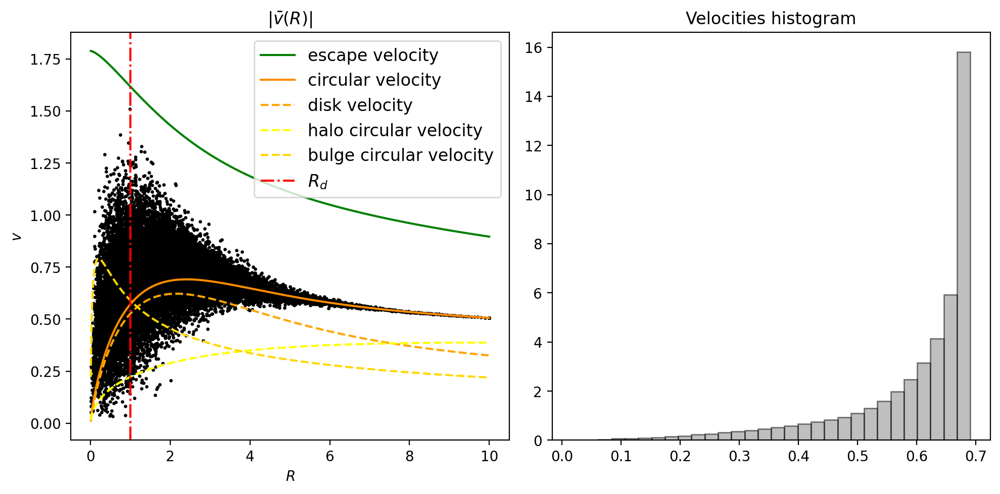

In [25]:
fig = plt.figure(tight_layout=True, figsize=(10, 5)) 

ax = fig.add_subplot(121)
ax.scatter(R[np.argsort(R)], v[np.argsort(R)], color='black', s=2) 
ax.plot(R[np.argsort(R)], v_escape(R)[np.argsort(R)], color='green', label='escape velocity') 
ax.plot(R[np.argsort(R)], v_circ(R)[np.argsort(R)], color='darkorange', label='circular velocity')
ax.plot(R[np.argsort(R)], v_circ_disk(R)[np.argsort(R)], color='orange', linestyle='dashed', label='disk velocity')
ax.plot(R[np.argsort(R)], v_Hern(R, M_halo, a_halo)[np.argsort(R)], color='yellow', linestyle='dashed', label='halo circular velocity')
ax.plot(R[np.argsort(R)], v_Hern(R, M_bulge, a_bulge)[np.argsort(R)], color='gold', linestyle='dashed', label='bulge circular velocity')
ax.axvline(x=R_d, label='$R_d$', c='red', linestyle='-.')
ax.set_xlabel('$R$')
ax.set_ylabel('$v$')
#ax.set_ylim(-1,4)
ax.legend(fontsize='large')
ax.set_title(r'$|\bar{v}(R)|$')

ax = fig.add_subplot(122)
ax.hist(vphi_mean, bins=30, histtype='barstacked', color='grey', fill='true', alpha=0.5, edgecolor='black', density=True)
ax.set_title('Velocities histogram')

plt.tight_layout()
plt.show()

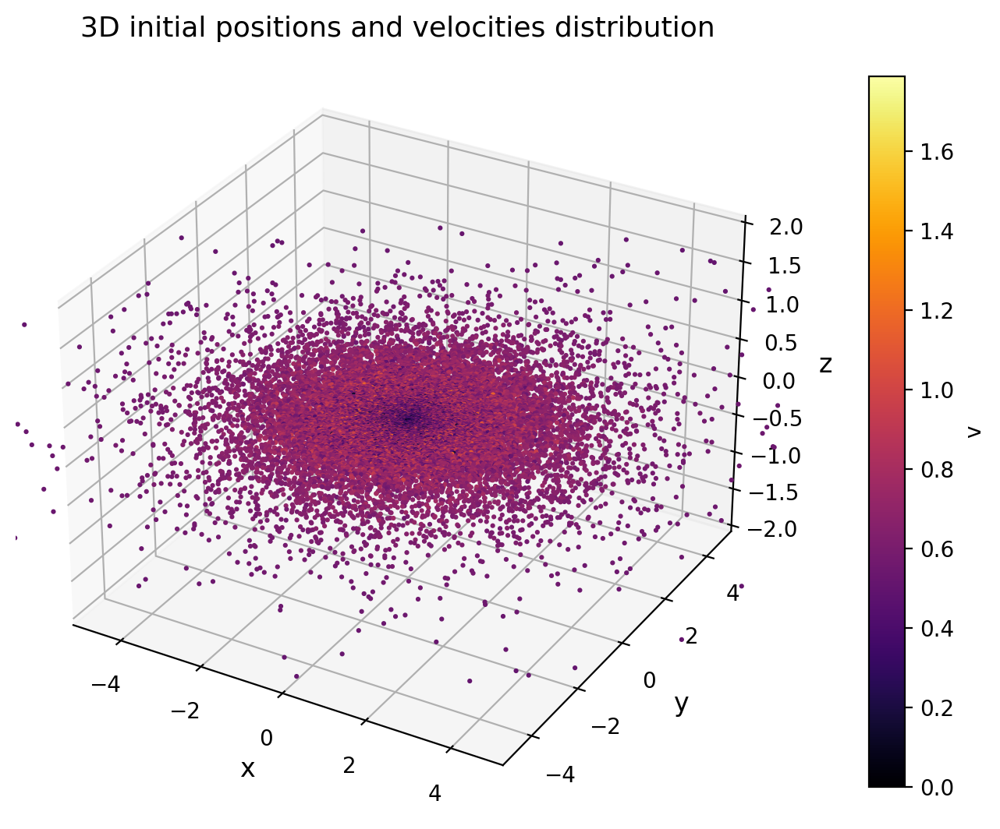

In [26]:
fig = plt.figure(figsize=(6, 6))
ax  = plt.axes(projection='3d')

image=ax.scatter(x, y, z, c = v, alpha=1, s=1.5, cmap='inferno', clim=(0, max(v_escape(R))))
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.set_zlabel('z', fontsize=12)
ax.set_xlim(-5 * R_d, 5 * R_d)
ax.set_ylim(-5 * R_d, 5 * R_d)
ax.set_zlim(-2 * R_d, 2 * R_d) 
ax.set_title('3D initial positions and velocities distribution', fontsize=13)
#ax.axis('equal')
plt.tight_layout()
plt.colorbar(image, label='v', fraction=0.04, pad=0.1);

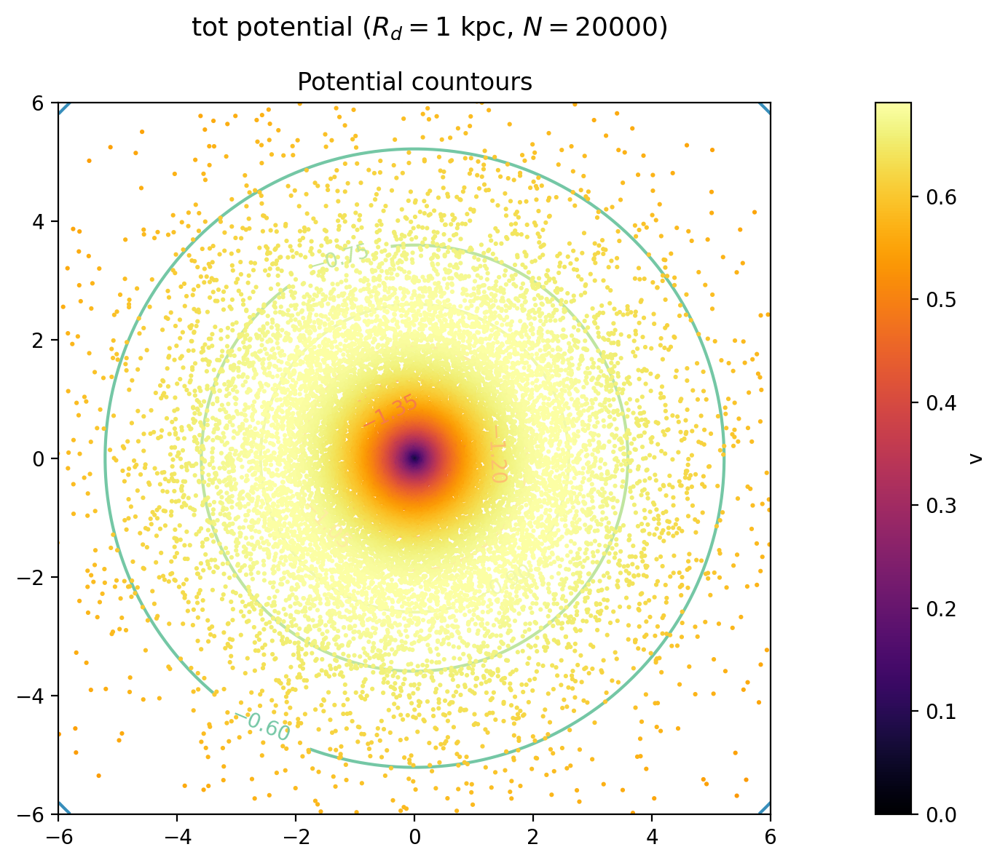

In [27]:
Z = tot_pot(np.sqrt(X**2+Y**2))

fig = plt.figure(figsize=(8, 6), tight_layout=True)
fig.suptitle('tot potential ($R_d='f'{R_d}''$ kpc, $N ='f'{N}''$)', fontsize=13)

ax = fig.add_subplot(111)

image=ax.scatter(x, y, c = v_circ(R), alpha=1, s=1.5, cmap='inferno', clim=(0, max(v_circ(R)))) 
CS = ax.contour(X, Y, Z, cmap='Spectral', zorder=-1)
ax.clabel(CS, inline=True, fontsize=10)
ax.set_title('Potential countours')
ax.set_xlim(-6 * R_d, 6 * R_d)
ax.set_ylim(-6 * R_d, 6 * R_d)
ax.set_aspect('equal')

plt.colorbar(image, label='v', fraction=0.04, pad=0.1);
plt.tight_layout();

# Running the simulation

Once we set out our parameters we can simulate the disk using the correct compiled $\texttt{treecode}$ module (the one with the Hernquist sphere implemented in it).

## Writing input file

In [ ]:
# open the file
file = open('exp_disk_distribution20k_halo.txt', 'w')

# write the file
file.write(f'{N}\n')
file.write('3\n') # dimensions
file.write('0\n')

for i in range(N):
    file.write(f'{m}\n')

for i in range(N):
    file.write(f'{x[i]} {y[i]} {z[i]}\n')
    
for i in range(N):
    file.write(f'{vx[i]} {vy[i]} {vz[i]}\n')
    #file.write(f'{new_vel_x[i]} {new_vel_y[i]} {new_vel_z[i]}\n')

# close the file
file.close()

# Fetch input data

In [28]:
lines = pd.read_csv('exp_disk_distribution20k_halo.txt', names = list(range(3)), sep = '\s+')                 #N=20k

## Set treecode params

In [29]:
T = 2 * np.pi / omega_tot(R_d)
print('Orbital period for R=R_d:', T)

Orbital period for R=R_d: 10.978525277396656


In [30]:
T_sim = 50 * T
print('Simulation time:', T_sim)

dt = T_sim / 1000
print('Time step:', dt)

theta = 0.2
print('Theta:', theta)

t_out = dt
print('Terminal out:', t_out)

Simulation time: 548.9262638698328
Time step: 0.5489262638698328
Theta: 0.2
Terminal out: 0.5489262638698328


## Launch treecode sim

In [ ]:
open('outdata_expdisk20k_halo.txt', 'w').close()
os.system('time ./treecode in=exp_disk_distribution20k_halo.txt  dtime='+ str(dt) +' theta='+str(theta)+ ' tstop='+str(T_sim) +' dtout='+str(t_out)+' out=outdata_expdisk20k_halo.txt >logout.txt')

# (quick) Analysis of results

In [31]:
# reading the data from output-selected file

lines = pd.read_csv('outdata_expdisk20k_halo.txt', names = list(range(3)), sep = '\s+')

N_particles = N
s = N*3+3

t_s  = np.array([lines.iloc[2::s,0].copy().dropna()]).flatten()
m_s  = np.array([lines.iloc[i::s,0].copy().dropna() for i in range(3, N+3)])
x_s  = np.array([lines.iloc[i::s,0].copy().dropna() for i in range(N+3, 2*N+3)])
y_s  = np.array([lines.iloc[i::s,1].copy().dropna() for i in range(N+3, 2*N+3)])
z_s  = np.array([lines.iloc[i::s,2].copy().dropna() for i in range(N+3, 2*N+3)])
vx_s = np.array([lines.iloc[i::s,0].copy().dropna() for i in range(2*N+3, 3*N+3)])
vy_s = np.array([lines.iloc[i::s,1].copy().dropna() for i in range(2*N+3, 3*N+3)])
vz_s = np.array([lines.iloc[i::s,2].copy().dropna() for i in range(2*N+3, 3*N+3)])

In [32]:
R_t = np.zeros((N,len(t_s)))

for k in range(0,len(t_s)):
    R_t[:,k] = np.sqrt( x_s[:,k]**2 + y_s[:,k]**2 + z_s[:,k]**2)
    
R_t.shape

(20000, 1001)

In [33]:
x_cm_t = np.zeros(len(t_s))
y_cm_t = np.zeros(len(t_s))
z_cm_t = np.zeros(len(t_s))

for i in range(len(t_s)):

    x_cm_t[i] = np.sum(x_s[:,i])/N
    y_cm_t[i] = np.sum(y_s[:,i])/N
    z_cm_t[i] = np.sum(z_s[:,i])/N
    
R_cm = np.sqrt((x_cm_t)**2 + (y_cm_t)**2 + (z_cm_t)**2)
R_cm

array([0.01224801, 0.01357763, 0.01504705, ..., 0.06652632, 0.06685758,
       0.06713197])

In [34]:
v_t = np.zeros((N,len(t_s)))

for k in range(0,len(t_s)):
    v_t[:,k] = np.sqrt( vx_s[:,k]**2 + vy_s[:,k]**2 + vz_s[:,k]**2 )
    
v_t.shape

(20000, 1001)

In [35]:
dens_t = np.zeros((N,len(t_s)))

for k in range(0,len(t_s)):
    dens_t[:,k] = dens(R_t[:,k])
    
dens_t.shape

(20000, 1001)

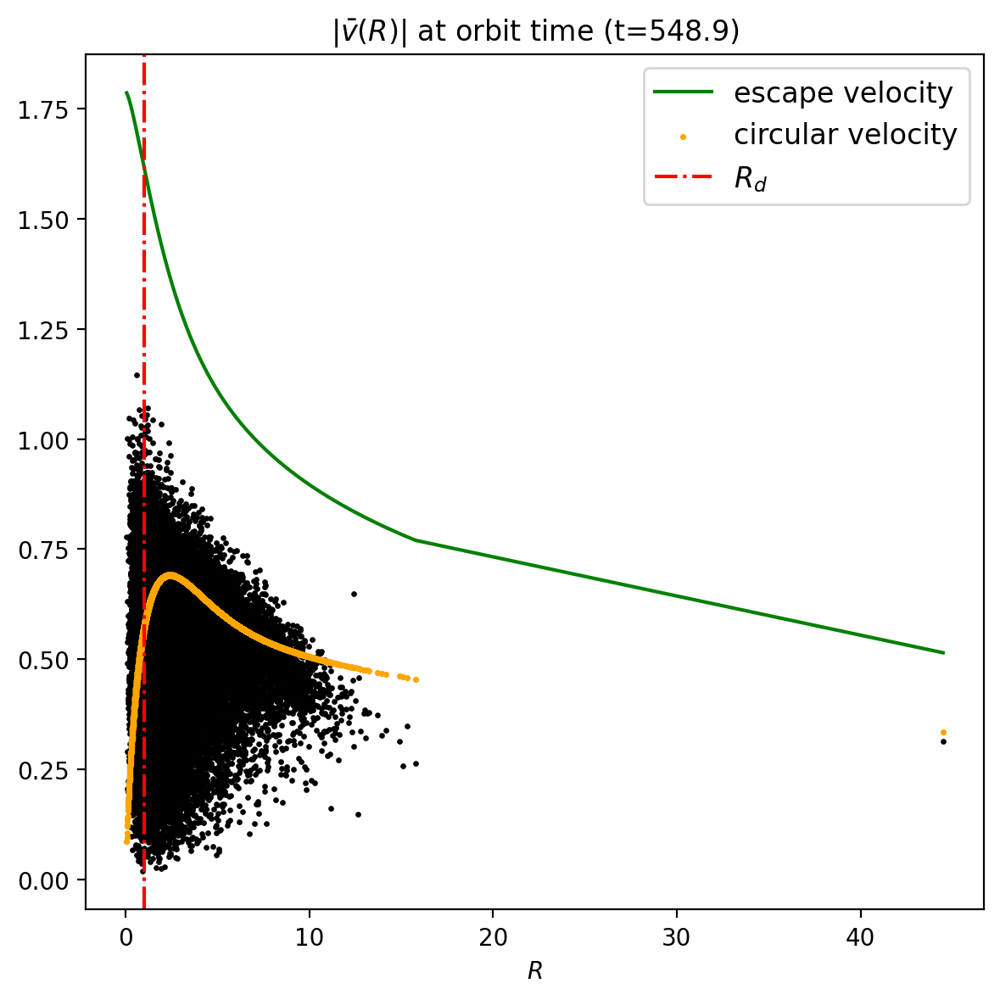

In [36]:
fig, ax = plt.subplots(tight_layout=True, figsize=(6, 6)) 

ax.scatter(R_t[:,len(t_s)-1][np.argsort(R_t[:,len(t_s)-1])], v_t[:,len(t_s)-1][np.argsort(R_t[:,len(t_s)-1])], color='black', s=2) 
ax.plot(R_t[:,len(t_s)-1][np.argsort(R_t[:,len(t_s)-1])], v_escape(R_t[:,len(t_s)-1])[np.argsort(R_t[:,len(t_s)-1])], color='green', label='escape velocity') 
ax.scatter(R_t[:,len(t_s)-1][np.argsort(R_t[:,len(t_s)-1])], v_circ(R_t[:,len(t_s)-1])[np.argsort(R_t[:,len(t_s)-1])], color='orange', s=2.5, label='circular velocity')
ax.axvline(x=R_d, label='$R_d$', c='red', linestyle='-.')
ax.set_xlabel('$R$')
#ax.set_ylabel('$v$')
#ax.set_xlim(-1,12*R_d)
#§ax.set_ylim(-0.2,2)
ax.legend(fontsize='large')
ax.set_title(r'$|\bar{v}(R)|$ at orbit time 'f'(t={round(T_sim,1)})');

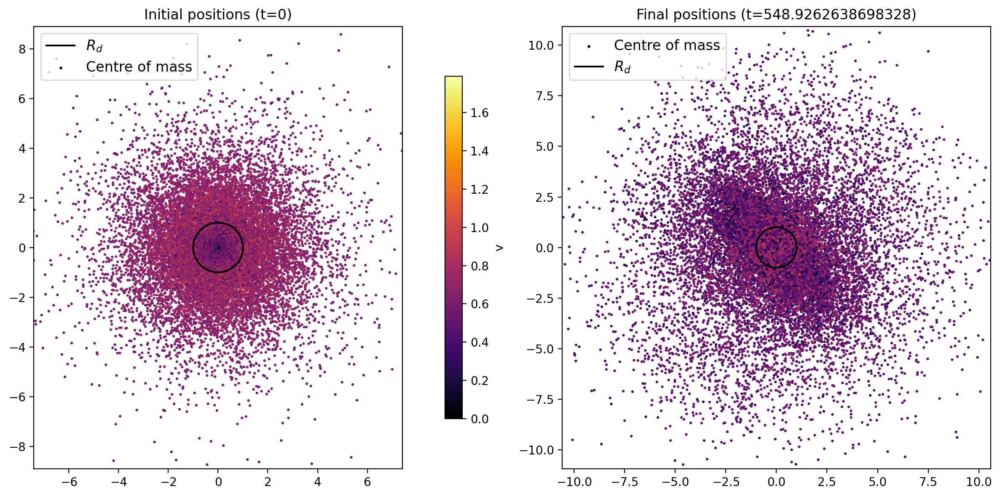

In [37]:
fig, ax = plt.subplots(1,2, tight_layout=True, figsize=(12, 6)) 

theta_Rd = np.linspace(0, 2*np.pi, 100)
x1 = R_d*np.cos(theta_Rd)
x2 = R_d*np.sin(theta_Rd)

#ax[0].scatter(x_s[:, 0], y_s[:, 0], c = np.sqrt(x_s[:, 0]**2+y_s[:, 0]**2), alpha=1, s=1.5, cmap='inferno', clim=(-6 * R_d, 6 * R_d))
img=ax[0].scatter(x_s[:, 0], y_s[:, 0], c = v_t[:,0], alpha=1, s=1.5, cmap='inferno', clim=(0, max(v_escape(R))))
ax[0].set_title('Initial positions (t=0)')
ax[0].plot(x1, x2, color='black',alpha=1, label='$R_d$')
ax[0].scatter(x_cm, y_cm, s=2, c='black', marker='o', label='Centre of mass') #Center of mass
ax[0].axis('equal')
ax[0].legend(fontsize='large')
ax[0].set_xlim(-7 * R_d, 7 * R_d)
ax[0].set_ylim(-7 * R_d, 7 * R_d)
plt.colorbar(img, label='v', fraction=0.04, pad=0.1);

#ax[1].scatter(x_s[:, len(t_s)-1], y_s[:, len(t_s)-1], c = np.sqrt(x_s[:, len(t_s)-1]**2+y_s[:, len(t_s)-1]**2), alpha=1, s=1.5, cmap='inferno', clim=(-6 * R_d, 6 * R_d))
ax[1].scatter(x_s[:, len(t_s)-1], y_s[:, len(t_s)-1], c = v_t[:,len(t_s)-1], alpha=1, s=1.5, cmap='inferno', clim=(0, max(v_escape(R_t[:,len(t_s)-1]))))
ax[1].scatter(x_cm_t[len(t_s)-1], y_cm_t[len(t_s)-1], s=2, c='black', marker='o', label='Centre of mass') #Center of mass
ax[1].set_title(f'Final positions (t={T_sim})')
ax[1].plot(x1, x2, color='black',alpha=1, label='$R_d$')
ax[1].axis('equal')
ax[1].legend(fontsize='large')
ax[1].set_xlim(-10 * R_d, 10 * R_d)
ax[1].set_ylim(-10 * R_d, 10 * R_d);

## Lagrangian radii

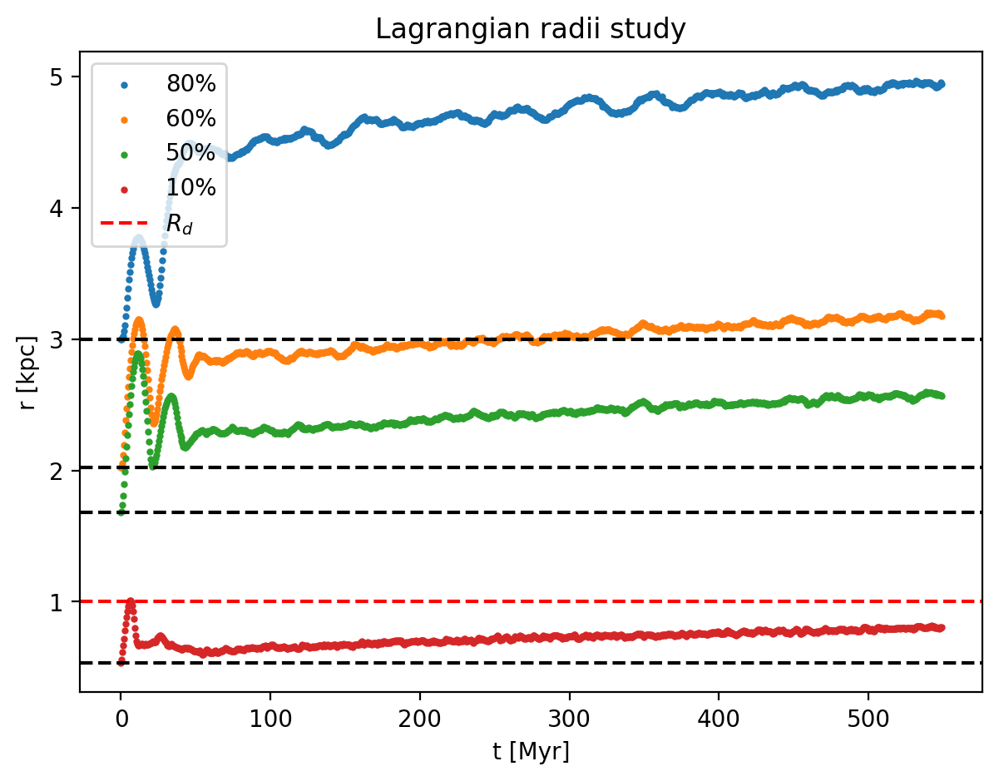

In [38]:
#lagrangian radii
#%matplotlib inline

plt.figure(figsize=(7, 5))

lag_80 = []
lag_60 = []
lag_50 = []
lag_10 = []

for i in range(len(t_s)):
    r_sort = R_t[:,i]

    lag_80.append(np.max(r_sort[r_sort < np.quantile(r_sort, 0.8)]))
    lag_60.append(np.max(r_sort[r_sort < np.quantile(r_sort, 0.6)]))
    lag_50.append(np.max(r_sort[r_sort < np.quantile(r_sort, 0.5)]))
    lag_10.append(np.max(r_sort[r_sort < np.quantile(r_sort, 0.1)]))
    
plt.scatter(t_s, lag_80, label="80%",s=4)
plt.scatter(t_s, lag_60, label="60%",s=4)
plt.scatter(t_s, lag_50, label="50%",s=4)
plt.scatter(t_s, lag_10, label="10%",s=4)
plt.axhline(R_d, color='r', linestyle='dashed', label='$R_d$')

plt.axhline(lag_80[0], color='black', linestyle='dashed')
plt.axhline(lag_60[0], color='black', linestyle='dashed')
plt.axhline(lag_50[0], color='black', linestyle='dashed')
plt.axhline(lag_10[0], color='black', linestyle='dashed')

plt.xlabel("t [Myr]")
plt.ylabel("r [kpc]")
plt.title("Lagrangian radii study")
plt.legend();
#plt.xlim(0,10)
#plt.ylim(0,25);

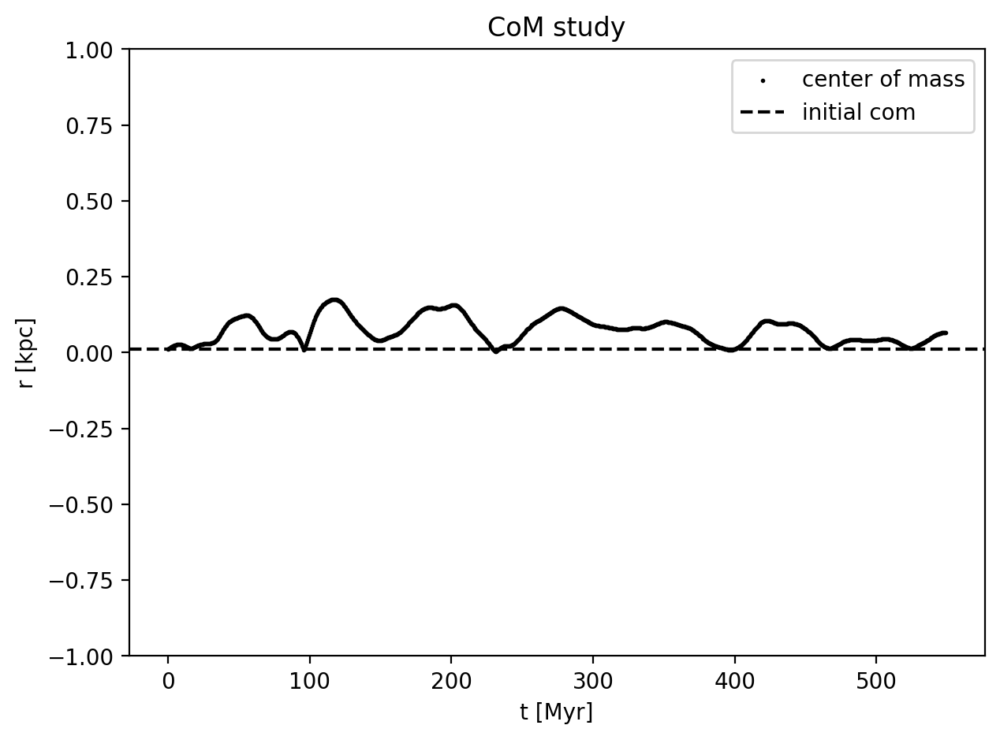

In [39]:
#com

plt.figure(figsize=(7, 5))
    
plt.scatter(t_s, R_cm, label="center of mass",s=1,c='black')
plt.axhline(np.sqrt(x_cm_t[0]**2 + y_cm_t[0]**2 + z_cm_t[0]**2), color='black', linestyle='dashed', label='initial com')

plt.xlabel("t [Myr]")
plt.ylabel("r [kpc]")
plt.title("CoM study")
plt.legend()
plt.ylim(-1*R_d,R_d);

## Evolution frames

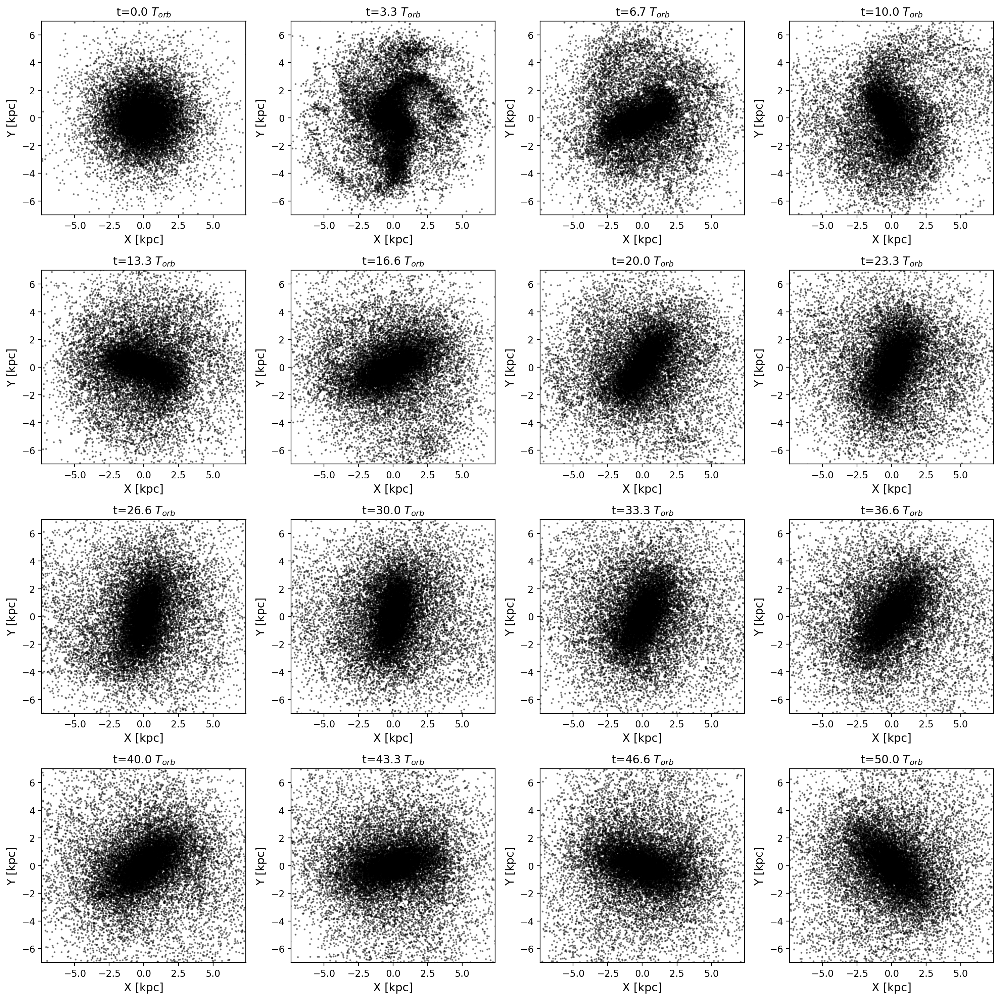

In [40]:
fig = plt.figure(figsize=(15, 15), tight_layout=True)

index=1
time_array=np.linspace(0, len(t_s)-1, 16, dtype=int)

t_dyn_units = t_s/T

for i in time_array:
    ax=fig.add_subplot(4,4,index)
    plt.scatter(x_s[:, i], y_s[:, i], c='black',s=1.2,alpha=0.4)#c = np.sqrt(x_s[:, i]**2+y_s[:, i]**2), alpha=0.4, s=1.5, cmap='inferno', clim=(-10 * R_d, 10 * R_d))
    plt.title(r't=%.1f $T_{orb}$' %t_dyn_units[i])
#    plt.scatter(x1, x2, color='red',alpha=1, s=0.5, label='$R_d$')
    plt.axis('equal')
    plt.xlabel('X [kpc]', fontsize=12)
    plt.ylabel('Y [kpc]', fontsize=12)
    plt.xlim(-7 * R_d, 7 * R_d)
    plt.ylim(-7 * R_d, 7 * R_d)
    
    index +=1
    
plt.show()

## 2d animation

In [42]:
positions = np.array([x_s.T, y_s.T, z_s.T]).T

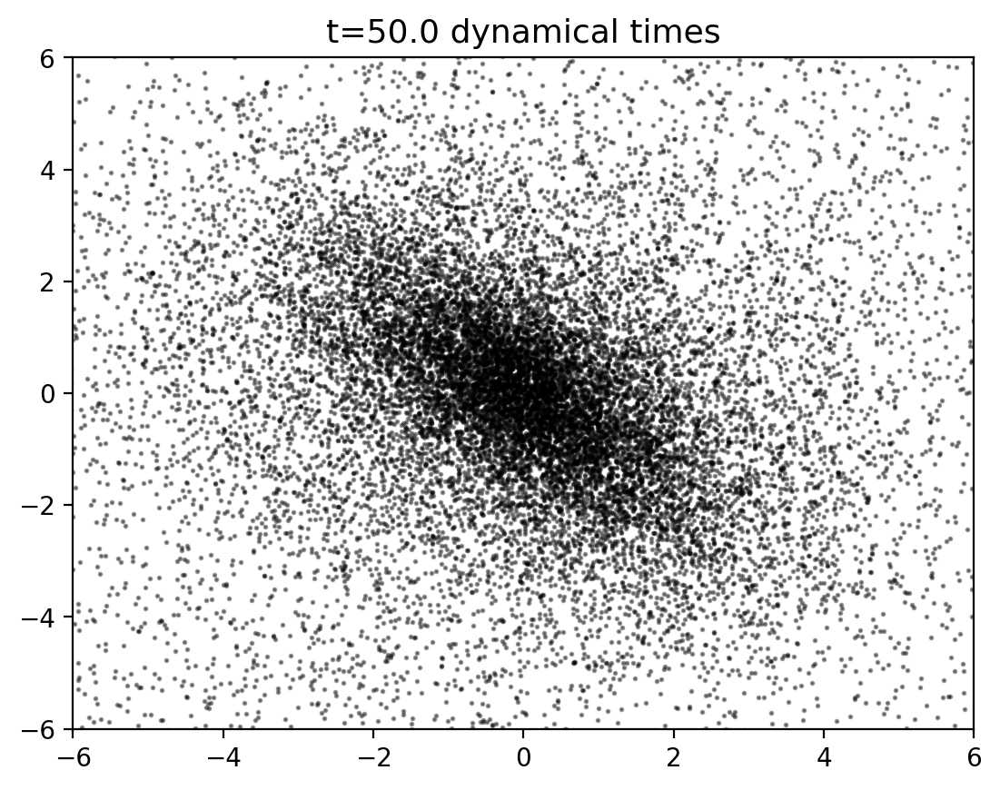

In [43]:
def create_particle_animation_2d(positions, interval=50, save_path=None):
    """
    Create a 2D animation of particle positions by ignoring the z-component.

    Parameters:
    - positions: A NumPy array of shape (num_particles, num_frames, 3) representing
                 the 3D positions of particles over time.
    - interval: Time delay between frames in milliseconds.
    - save_path: The path to save the animation as a video file (e.g., 'animation.mp4').

    Returns:
    - ani: The animation object.
    """
    num_particles, num_frames, _ = positions.shape

    fig, ax = plt.subplots()
    ax.set_xlim(-6*R_d, 6*R_d)
    ax.set_ylim(-6*R_d, 6*R_d)
    scatter = ax.scatter(positions[:, 0, 0], positions[:, 0, 1], c='black', s=1, alpha=0.4)

    def update(frame):
        scatter.set_offsets(positions[:, frame, :2])  # Ignore the z-component
        ax.set_title('t=%.1f dynamical times' %t_dyn_units[frame], fontsize=13)
        return scatter,

    ani = FuncAnimation(fig, update, frames=num_frames, interval=interval, blit=False)

    if save_path:
        ani.save(save_path, writer='ffmpeg', fps=interval)  # Adjust fps as needed

    plt.show()

    return ani

# Example usage:
# Assuming 'particle_positions' is a NumPy array of shape (num_particles, num_frames, 3)
# You should replace this with your actual data.
# In positions[:, :t, :] replace t with desired time before explosion eventually

create_particle_animation_2d(positions[:,:,:], save_path='esp_disk_2d_halo.gif')